Predict the chances of churn to retain customers by analyzing all relevant customer data 

# Importing Required Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Reading CSV Files

In [ ]:
customer_churn_train = pd.read_csv("/content/churn_train.csv")

In [ ]:
customer_churn_train.shape

(7043, 21)

# EDA

In [ ]:
customer_churn_train.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
customer_churn_train.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [ ]:
pd.unique(customer_churn_train['TotalCharges'])

array(['29.85', '1889.5', '108.15', ..., '346.45', '306.6', '6844.5'],
      dtype=object)

In [ ]:
data = customer_churn_train['TotalCharges']

for index in range(0, len(data)):
    try :
        skip = float(data[index])
    except ValueError :
        print(index,'--->' ,data[index])

488 --->  
753 --->  
936 --->  
1082 --->  
1340 --->  
3331 --->  
3826 --->  
4380 --->  
5218 --->  
6670 --->  
6754 --->  


In [ ]:
customer_churn_train = pd.read_csv("/content/churn_train.csv", na_values = ' ')
customer_churn_train.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

In [ ]:
customer_churn_train.customerID.nunique()

7043

In [ ]:
customer_churn_train.set_index('customerID', inplace = True)
customer_churn_train.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
customer_churn_train.Churn = customer_churn_train.Churn.astype('category').cat.codes
customer_churn_train.Churn

customerID
7590-VHVEG    0
5575-GNVDE    0
3668-QPYBK    1
7795-CFOCW    0
9237-HQITU    1
             ..
6840-RESVB    0
2234-XADUH    0
4801-JZAZL    0
8361-LTMKD    1
3186-AJIEK    0
Name: Churn, Length: 7043, dtype: int8

In [ ]:
cat_cols = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 
            'PhoneService', 'MultipleLines', 'InternetService', 
            'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
            'TechSupport', 'StreamingTV', 
            'StreamingMovies', 'Contract', 'PaperlessBilling', 
            'PaymentMethod']

In [ ]:
num_cols = customer_churn_train.columns[~customer_churn_train.columns.isin(cat_cols)]
print(num_cols)

Index(['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn'], dtype='object')


In [ ]:
num_cols = num_cols.delete(3)
num_cols

Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

In [ ]:
for x in cat_cols :
    print(x, '----->>', customer_churn_train[x].unique(), '\n')

gender ----->> ['Female' 'Male'] 

SeniorCitizen ----->> [0 1] 

Partner ----->> ['Yes' 'No'] 

Dependents ----->> ['No' 'Yes'] 

PhoneService ----->> ['No' 'Yes'] 

MultipleLines ----->> ['No phone service' 'No' 'Yes'] 

InternetService ----->> ['DSL' 'Fiber optic' 'No'] 

OnlineSecurity ----->> ['No' 'Yes' 'No internet service'] 

OnlineBackup ----->> ['Yes' 'No' 'No internet service'] 

DeviceProtection ----->> ['No' 'Yes' 'No internet service'] 

TechSupport ----->> ['No' 'Yes' 'No internet service'] 

StreamingTV ----->> ['No' 'Yes' 'No internet service'] 

StreamingMovies ----->> ['No' 'Yes' 'No internet service'] 

Contract ----->> ['Month-to-month' 'One year' 'Two year'] 

PaperlessBilling ----->> ['Yes' 'No'] 

PaymentMethod ----->> ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)'] 



In [ ]:
customer_churn_train[num_cols].describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7032.000000
mean,32.371149,64.761692,2283.300441
std,24.559481,30.090047,2266.771362
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.850000,3794.737500
max,72.000000,118.750000,8684.800000


In [ ]:
customer_churn_train.isnull().sum()

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

<AxesSubplot:>

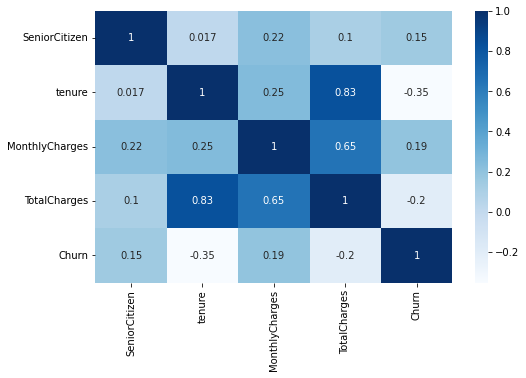

In [ ]:
plt.figure(figsize= (8,5))
sns.heatmap(customer_churn_train.corr(), annot=True, cmap='Blues')

# Data Visualization

<AxesSubplot:ylabel='Contract'>

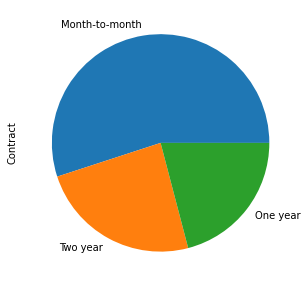

In [ ]:
plt.figure(figsize= (10,5))
customer_churn_train.Contract.value_counts().plot(kind='pie')

<AxesSubplot:ylabel='PaperlessBilling'>

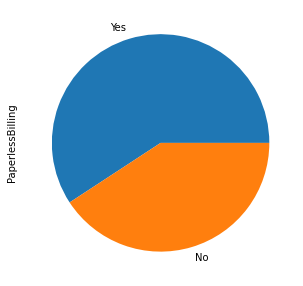

In [ ]:
plt.figure(figsize= (10,5))
customer_churn_train.PaperlessBilling.value_counts().plot(kind='pie')

<AxesSubplot:ylabel='PaymentMethod'>

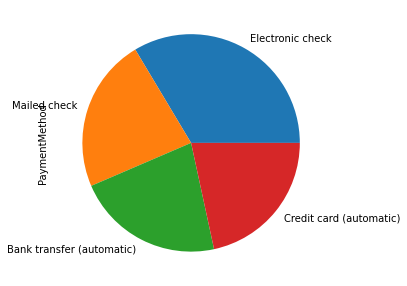

In [ ]:
plt.figure(figsize= (10,5))
customer_churn_train.PaymentMethod.value_counts().plot(kind='pie')

<AxesSubplot:ylabel='Churn'>

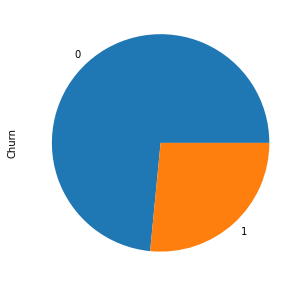

In [ ]:
plt.figure(figsize= (10,5))
customer_churn_train.Churn.value_counts().plot(kind='pie')

In [ ]:
def churn_rates(customer_churn_train,cols,set_hue=None):
    fig , ax = plt.subplots(1,len(cols),figsize=(7*len(cols),6))
    for i , col in enumerate(cols):
        sns.barplot(data=customer_churn_train,x=col , y='Churn',ax=ax[i],hue=set_hue)
        ax[i].set_title(f'{col} Churn Rates')
    plt.show()

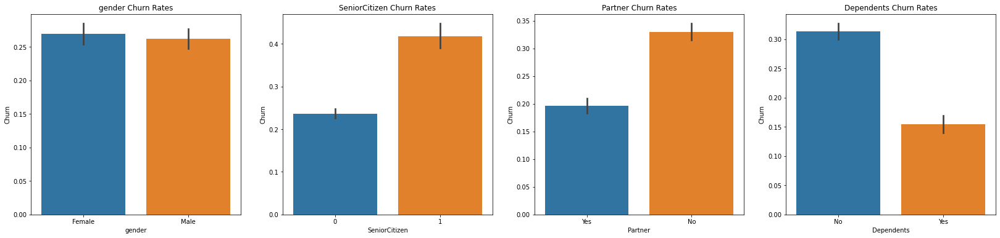

In [ ]:
churn_rates(customer_churn_train,['gender','SeniorCitizen','Partner','Dependents'])

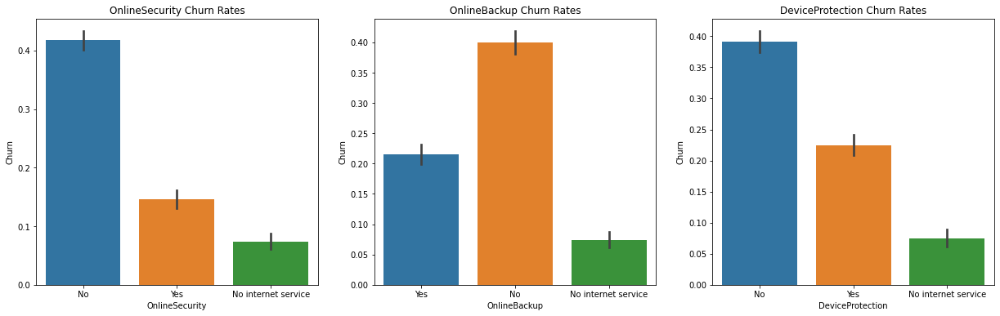

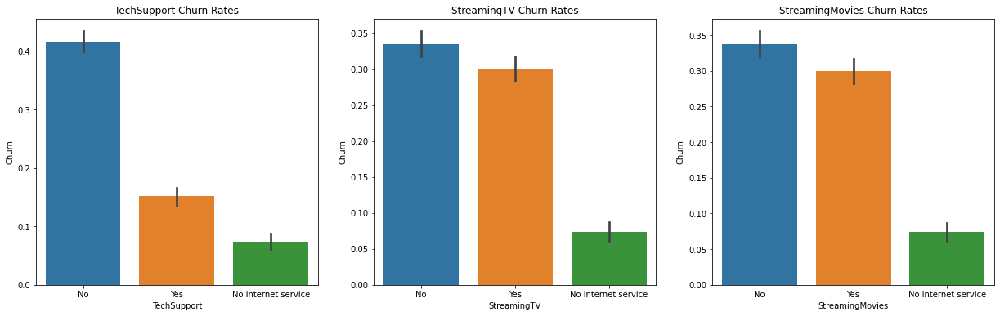

In [ ]:

churn_rates(customer_churn_train,['OnlineSecurity','OnlineBackup','DeviceProtection'])
churn_rates(customer_churn_train,['TechSupport','StreamingTV','StreamingMovies'])


# Outliers

<AxesSubplot:xlabel='tenure'>

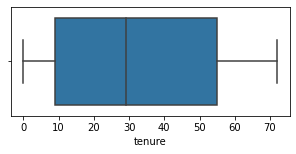

In [ ]:
plt.figure(figsize= (5,2))
sns.boxplot(customer_churn_train['tenure'])

<AxesSubplot:xlabel='MonthlyCharges'>

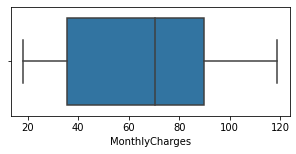

In [ ]:
plt.figure(figsize= (5,2))
sns.boxplot(customer_churn_train['MonthlyCharges'])

<AxesSubplot:xlabel='TotalCharges'>

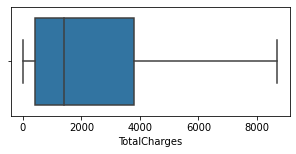

In [ ]:
plt.figure(figsize= (5,2))
sns.boxplot(customer_churn_train['TotalCharges'])

# Function to prepare data

In [ ]:
X = customer_churn_train.drop('Churn', axis = 1)
y = customer_churn_train["Churn"]

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
num_imputer = SimpleImputer()

In [ ]:
def prepare_data(X, y, split_size = 0.3) :
    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = split_size,
                                                        random_state=12)  
    num_imputer.fit(X_train[num_cols])
    print(X_train.shape)
    print(X_test.shape)
    return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = prepare_data(X, y)

(4930, 19)
(2113, 19)


# Data Preprocessing

In [ ]:
def preprocess_data(data) :
    
    # impute numerical features
    data[num_cols] = num_imputer.transform(data[num_cols])
    
    # dummify categorical features
    data = pd.get_dummies(data, drop_first = True)

    return data

In [ ]:
X_train = preprocess_data(X_train)
X_train.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
customerID,,,,,,,,,,,,,,,,,,,,,
1431-CYWMH,0,22.0,19.05,454.05,0,1,1,1,0,0,...,1,0,1,0,0,0,0,0,0,0
6815-ABQFQ,0,56.0,107.25,6033.30,1,1,0,1,0,1,...,0,1,0,1,1,0,1,0,1,0
5245-VDBUR,0,52.0,35.45,1958.95,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
5453-AXEPF,0,17.0,80.50,1336.90,1,1,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
2654-VBVPB,0,1.0,19.90,19.90,0,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,0


In [ ]:
X_test = preprocess_data(X_test)
X_test.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
customerID,,,,,,,,,,,,,,,,,,,,,
5180-UCIIQ,1,22.0,40.05,880.2,1,1,1,0,1,0,...,0,0,0,1,0,0,0,0,0,1
8868-WOZGU,0,28.0,105.70,2979.5,1,0,0,1,0,1,...,0,1,0,1,0,0,1,0,1,0
5012-YSPJJ,0,31.0,54.35,1647.0,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1
7225-CBZPL,1,17.0,94.80,1563.9,1,1,0,1,0,1,...,0,1,0,1,0,0,1,0,1,0
0334-ZFJSR,0,55.0,66.05,3462.1,0,1,0,1,0,1,...,0,0,0,0,1,0,1,1,0,0



# Model Building

In [ ]:
def model_building(model, params = None) :
    
    if params == None :
        model.fit(X_train, y_train)
        
        # return fitted model & train-test predictions
        return (model, model.predict(X_train), model.predict(X_test))
    
    

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(criterion="entropy")
model, pred_train, pred_test = model_building(dtc)


# Feature Importance







In [ ]:
model.feature_importances_

array([0.02325678, 0.14853145, 0.20604313, 0.20235028, 0.02378979,
       0.0196878 , 0.02016472, 0.00080025, 0.00100037, 0.0133504 ,
       0.05889637, 0.        , 0.        , 0.01847054, 0.        ,
       0.01419698, 0.00097034, 0.01654264, 0.00547811, 0.02126985,
       0.00039963, 0.00934959, 0.        , 0.01264473, 0.01859846,
       0.10435009, 0.01838527, 0.01089182, 0.01721407, 0.01336653])

In [ ]:
importance = pd.DataFrame([model.feature_importances_], columns = X_train.columns)
importance.sort_values(by = 0, axis = 1, ascending = False, inplace = True)

In [ ]:
importance

,MonthlyCharges,TotalCharges,tenure,Contract_Two year,InternetService_Fiber optic,gender_Male,SeniorCitizen,TechSupport_Yes,Dependents_Yes,Partner_Yes,...,StreamingTV_Yes,TechSupport_No internet service,MultipleLines_No phone service,DeviceProtection_No internet service,PhoneService_Yes,StreamingTV_No internet service,OnlineBackup_No internet service,OnlineSecurity_No internet service,StreamingMovies_No internet service,InternetService_No
0,0.206043,0.20235,0.148531,0.10435,0.058896,0.02379,0.023257,0.02127,0.020165,0.019688,...,0.00935,0.005478,0.001,0.00097,0.0008,0.0004,0.0,0.0,0.0,0.0


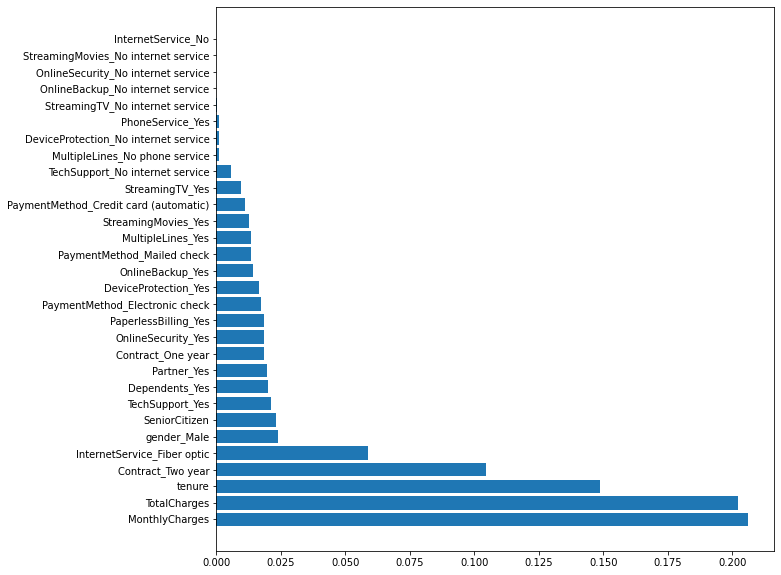

In [ ]:
plt.rcParams["figure.figsize"] = 10,10
plt.barh(importance.columns, importance.iloc[0].values)
plt.show()

# Model Evaluation

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
def model_evaluation(actuals, predictions) :
    print('\nAccuracy Score :', accuracy_score(actuals, predictions)) 
    

In [ ]:
model_evaluation(y_train, pred_train)

model_evaluation(y_test, pred_test)


Accuracy Score : 0.9975659229208925

Accuracy Score : 0.7382867960246096


In [ ]:
from six import StringIO
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

In [ ]:
def plot_dt(model) :
    
    dot_data = StringIO()
    export_graphviz(model, out_file = dot_data, filled = True)
    
    return pydotplus.graph_from_dot_data(dot_data.getvalue()) 

In [ ]:
Image(plot_dt(model).create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.846955 to fit



# Using Max_Depth

In [ ]:
dtc_2 = DecisionTreeClassifier(criterion="entropy",max_depth = 8)

model_2, pred_train_2, pred_test_2 = model_building(dtc_2)

In [ ]:
model_evaluation(y_train, pred_train_2)

model_evaluation(y_test, pred_test_2)


Accuracy Score : 0.8241379310344827

Accuracy Score : 0.7898722195929957


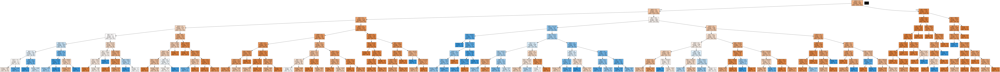

In [ ]:
Image(plot_dt(model_2).create_png())